# Tracking with TeamTrack

In [1]:
%load_ext autoreload
%autoreload 2

## Preparing the dataset 

In [3]:
import sportslabkit as slk
from sportslabkit.logger import set_log_level

dataset_path = slk.datasets.get_path("wide_view")
path_to_csv = sorted(dataset_path.glob("annotations/*.csv"))[0]
path_to_mp4 = sorted(dataset_path.glob("videos/*.mp4"))[0]

root = slk.utils.get_git_root()
cam = slk.Camera(path_to_mp4)

# For the sake of speed, we'll only use the first 10 frames
n_frames = 2
frames = cam[:n_frames]

bbdf_gt = slk.load_df(path_to_csv)
# TODO: Hopefully we can get rid of this 
if bbdf_gt.index[0] == 0:
    bbdf_gt.index += 1
bbdf_gt = bbdf_gt[:n_frames]

In [13]:
from sportslabkit.mot import TeamTracker
import numpy as np 

slk.logger.set_log_level('INFO')
det_model = slk.detection_model.load(
    model_name='yolov8',
    model=root/'models/yolov8/Soccer_SideView.pt',
    conf=0.25,
    iou=0.6,
    imgsz=640,
    device='mps',
    classes=0,
    augment=True,
    max_det=35
)

image_model = slk.image_model.load(
    model_name='mobilenetv2_x1_0',
    image_size=(32,32),
    device='mps'
)

motion_model = slk.motion_model.load(
    model_name='SingleTargetLinear',
)
# motion_model = slk.motion_model.load(
#     model_name='SingleTargetLSTM',
#     model='/Users/atom/Github/SoccerTrack/models/teamtrack/LSTM-F_Soccer_Tsukuba3-epoch=79-val_nll_loss=-2.74.ckpt',
# )

keypoint_json = root / 'notebooks/02_user_guide/assets/soccer_keypoints.json'
cam.source_keypoints, cam.target_keypoints = slk.utils.load_keypoints(keypoint_json)

# calibration model return a 3x3 homography matrix for each frame
calibration_model = slk.calibration_model.load(
    model_name='DummyCalibrationModel',
    homographies=cam.H,
    mode='constant'
)

first_matching_fn = slk.matching.MotionVisualMatchingFunction(
    motion_metric=slk.metrics.EuclideanCMM2D(use_pred_pt=True),
    motion_metric_gate=0.2,
    visual_metric=slk.metrics.CosineCMM(),
    visual_metric_gate=0.2,
    beta=0.9,
)

second_matching_fn = slk.matching.SimpleMatchingFunction(
    metric=slk.metrics.EuclideanCMM2D(use_pred_pt=True),
    gate=0.9,
)

# team_detection_callback = slk.callbacks.TeamDetectionCallback(classication_model=TeamClassifier())

class PrintingCallback(slk.callbacks.Callback):
    def on_track_sequence_start(self, tracker):
        tracklets = tracker.alive_tracklets + tracker.dead_tracklets
        print(f"Tracking started with {len(tracklets)} tracklets")
    
    def on_track_sequence_end(self, tracker):
        tracklets = tracker.alive_tracklets + tracker.dead_tracklets
        print(f"Tracking ended with {len(tracklets)} tracklets")

callbacks = [PrintingCallback()]

tracker = TeamTracker(
    detection_model=det_model,
    image_model=image_model,
    motion_model=motion_model,
    calibration_model=calibration_model,
    first_matching_fn=first_matching_fn,
    second_matching_fn=second_matching_fn,
    detection_score_threshold=0.6,
    max_staleness=2,
    min_length=2,
    callbacks=callbacks,
)

In [14]:
tracker.track(frames)

Tracking started with 0 tracklets


Tracking Progress: 100%|██████████| 2/2 [00:26<00:00, 13.19s/it, Active: 2, Dead: 0]


Tracking ended with 2 tracklets


TeamID                0                                               \
PlayerID   190748846736                                                
Attributes      bb_left      bb_top   bb_width   bb_height      conf   
frame                                                                  
1           3451.514038  778.707825  84.657471  109.827271  0.728325   
2           3445.628784  778.191681  87.499268  112.391052  0.704968   

TeamID                                                               
PlayerID   296367909012                                              
Attributes      bb_left      bb_top   bb_width  bb_height      conf  
frame                                                                
1           3526.947632  593.547302  39.347900  71.908447  0.666210  
2           3527.001953  594.881866  39.145996  71.393005  0.665943

In [15]:
all_tracklets = tracker.alive_tracklets + tracker.dead_tracklets
all_tracklets

[Tracklet(id=190748846736, current_box=[     3445.6      778.19      87.499      112.39]),
 Tracklet(id=296367909012, current_box=[       3527      594.88      39.146      71.393])]

In [17]:
tracklet = all_tracklets[0]
tracklet.print()

print(tracklet.feature.shape)
print(np.shape(tracklet.get_observations('feature')))

print(tracklet.teamid)

tracklet.register_state_type('teamid')
tracklet.update_state('teamid', predicted_teamid)

print(tracklet.states)

╔═══════════════════════════════════════════════════════════════════════════════════════════╗
║ Tracklet(id=190748846736, steps_alive=2, staleness=0, is_active=True)                     ║
╟───────────────────────────────────────────────────────────────────────────────────────────╢
║  box: [[     3445.6      778.19      87.499      112.39]]                                 ║
║  frame: [2]                                                                               ║
║  score: [0.7049681544303894]                                                              ║
║  feature: [[   0.097687    0.060742     0.19127 ...     0.35401     0.3]                  ║
║  pt: [[     51.743      68.149]]                                                          ║
╚═══════════════════════════════════════════════════════════════════════════════════════════╝
(1280,)
(2, 1280)


AttributeError: 'Tracklet' object has no attribute 'teamid'

In [ ]:
predit_teamid

def f(all_tracklets):
    for tracklet in all_tracklets:
        prediction_id = predit_teamid(tracklet)
        tracklet.teamid = xxx

    return all_tracklets
f(all_tracklets)

In [29]:
from sportslabkit.metrics import hota_score

bbdf = tracker.track(frames)
score = hota_score(bboxes_track=bbdf, bboxes_gt=bbdf_gt)["HOTA"]

print(f'HOTA score: {score:.2f}')

Tracking Progress:  60%|██████    | 6/10 [06:42<04:28, 67.06s/it, Active: 12, Dead: 0]


KeyboardInterrupt: 

In [9]:
bbdf

TeamID                0                                              \
PlayerID   115311190039                                               
Attributes      bb_left      bb_top   bb_width  bb_height      conf   
frame                                                                 
1           3541.295410  605.934784  24.224121  54.484192  0.780812   
2           3540.165405  606.983490  24.728760  54.579651  0.786653   
3           3539.460449  609.645874  26.961426  54.391968  0.781938   
4           3538.869141  610.476776  27.561523  53.457336  0.775804   
5           3534.976318  611.329224  33.390137  52.482788  0.742279   
6           3532.570557  611.586456  33.160156  51.487000  0.723445   
7           3531.426392  607.327911  30.555420  52.162048  0.703663   
8           3527.792480  607.220215  31.126953  52.197021  0.717264   
9           3522.934326  612.018127  32.066895  50.833618  0.727944   
10          3518.652832  611.768372  31.993652  49.696777  0.743633   

TeamID                                                               ...  \
PlayerID   591007594281                                              ...   
Attributes      bb_left      bb_top   bb_width  bb_height      conf  ...   
frame                                                                ...   
1           3743.390869  662.655487  27.286133  71.113586  0.767533  ...   
2           3742.072144  663.020172  25.014893  70.133728  0.767880  ...   
3           3740.977539  663.496307  26.333496  70.558167  0.762919  ...   
4           3739.084717  662.912140  24.056641  71.042908  0.757229  ...   
5           3737.695801  663.176636  24.072754  72.003906  0.732292  ...   
6           3736.964355  664.045074  24.085938  71.062439  0.684872  ...   
7           3735.187378  665.574738  25.718994  69.305359  0.650396  ...   
8           3731.146362  663.593658  27.324463  70.639343  0.658136  ...   
9           3729.704834  663.708679  28.212402  70.938477  0.766340  ...   
10          3726.098145  664.431244  30.877930  70.831116  0.796106  ...   

TeamID                                                               \
PlayerID   195709359776                                               
Attributes      bb_left      bb_top   bb_width  bb_height      conf   
frame                                                                 
1           3184.316284  489.770081  16.712158  30.406799  0.603583   
2           3184.359741  489.628784  16.522705  30.308350  0.600147   
3           3184.594604  490.040405  16.491455  30.238159  0.609284   
4           3184.893677  489.578491  16.353271  30.136841  0.613613   
5           3185.007935  489.501358  16.451904  29.873993  0.614229   
6           3185.001587  489.158936  16.424561  29.729248  0.617699   
7           3184.959595  489.045532  16.472412  29.619812  0.619510   
8           3184.971069  488.839966  16.484619  29.588806  0.621190   
9           3184.676392  489.212692  16.663818  29.578644  0.619347   
10          3184.741943  489.176086  16.672363  29.465149  0.617759   

TeamID                                                               
PlayerID   151707933183                                              
Attributes      bb_left      bb_top   bb_width  bb_height      conf  
frame                                                                
1                   NaN         NaN        NaN        NaN       NaN  
2                   NaN         NaN        NaN        NaN       NaN  
3                   NaN         NaN        NaN        NaN       NaN  
4                   NaN         NaN        NaN        NaN       NaN  
5                   NaN         NaN        NaN        NaN       NaN  
6                   NaN         NaN        NaN        NaN       NaN  
7                   NaN         NaN        NaN        NaN       NaN  
8                   NaN         NaN        NaN        NaN       NaN  
9           3541.345581  553.943054  19.044189  41.377197  0.660127  
10          3541.735596  554.162964

In [12]:
hota_score(bboxes_track=bbdf, bboxes_gt=bbdf_gt)["HOTA"]


0.1681108930963409

In [1]:
%load_ext autoreload
%autoreload 2

In [53]:
import sportslabkit as slk
import numpy as np

motion_model = slk.motion_model.load(
    model_name='SingleTargetLSTM',
    model='/Users/atom/Github/SoccerTrack/models/teamtrack/LSTM-F_Soccer_Tsukuba3-epoch=79-val_nll_loss=-2.74.ckpt',
)

tracklet = slk.Tracklet()
tracklet.register_observation_types(['pt'])
tracklet.update_observation('pt', np.array([105, 65]))

motion_model(tracklet)

LSTM(
  (lstm): LSTM(2, 64, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fc0): Linear(in_features=128, out_features=18, bias=True)
)


tensor([[105.0209,  65.0018]])

In [42]:
motion_model = slk.motion_model.load(
    model_name='SingleTargetLinear',
)

motion_model(tracklet)

tensor([[  1., 105.]])

In [33]:
import sportslabkit as slk

tracklet = slk.Tracklet()
tracklet.register_observation_type('pt')
tracklet.update_observation('pt', [1,2])

motion_model = slk.motion_model.load(model_name='SingleTargetLSTM')
motion_model(tracklet)

tensor([[0.8091, 2.0158]])

---

---

## Line Detection

(14, 1, 2)


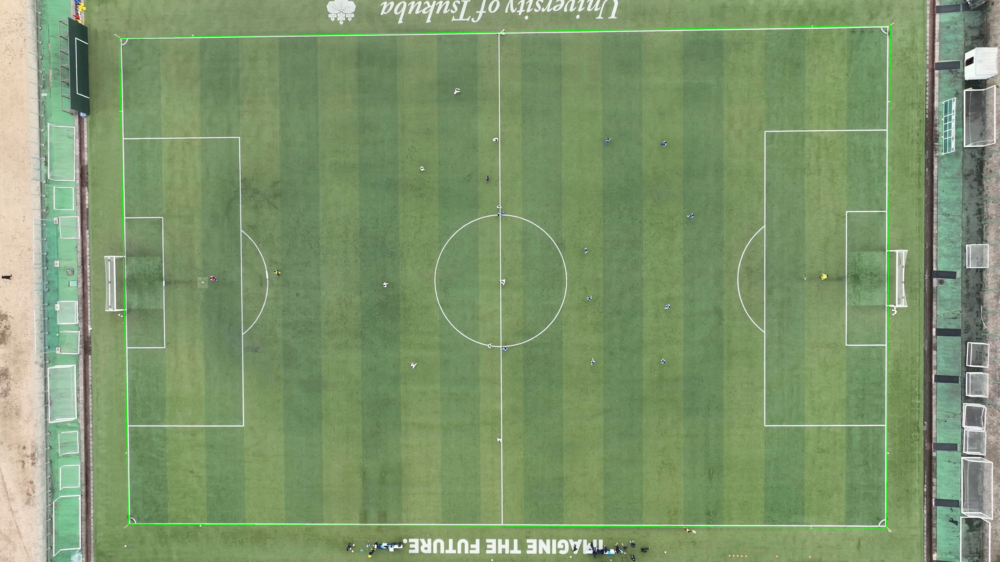

In [53]:
import numpy as np
import cv2
def detect_lines(image, length_threshold=50, distance_threshold=50, thickness=15, k=15):
    # make sure that the image is in grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # threshold image so values less than 127 are set to 0
    gray = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)[1]

    # change image type for line detection
    gray = gray.astype(np.uint8)

    # dilate image to fill in holes
    kernel = np.ones((k, k), np.uint8)
    gray = cv2.morphologyEx(gray, cv2.MORPH_CLOSE, kernel)

    # Create default Fast Line Detector class
    fld = cv2.ximgproc.createFastLineDetector(
        length_threshold=length_threshold,
        distance_threshold=distance_threshold,
    )
    # Get line vectors from the image
    lines = fld.detect(gray)

    # Draw lines on the image
    line_on_image = fld.drawSegments(
        np.zeros_like(gray), lines, linethickness=thickness
    )

    # image to black and white
    line_on_image = cv2.cvtColor(line_on_image, cv2.COLOR_BGR2GRAY)

    # otsu thresholding
    binary = cv2.threshold(line_on_image, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[
        1
    ]

    # binary = cv2.dilate(binary, None, iterations=0)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

    return binary

def FLD(
    image,
    length_threshold=50,
    distance_threshold=50,
    canny_th1=20.0,
    canny_th2=50.0,
    canny_aperture_size=5,
    do_merge=False,
):

    binary = detect_lines(
        image, length_threshold=150, distance_threshold=5, thickness=3, k=25
    )

    # save image
    # cv2.imwrite("../x_ignore/binary.png", binary)

    # find contours
    contours, _ = cv2.findContours(binary, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # make mask with largest contour
    max_cnt = max(contours, key=cv2.contourArea)
    # epsilon = 0.01*cv2.arcLength(max_cnt,True)
    # approx = cv2.approxPolyDP(max_cnt,epsilon,True)

    mask = np.zeros_like(
        image
    )  # Create mask where white is what we want, black otherwise
    # x, y, w, h = cv2.boundingRect(approx)
    rect = cv2.minAreaRect(max_cnt)
    # rect = cv2.minAreaRect(approx)
    box = cv2.boxPoints(rect)
    box = np.intp(box)
    hull = cv2.convexHull(max_cnt)
    return hull

import cv2
import numpy as np

def find_farthest_point(pt, points):
    """Find the point in 'points' that is farthest from 'pt'."""
    max_dist = 0
    farthest_pt = None
    for point in points:
        dist = cv2.norm(pt - point[0])  # Adjusted indexing here
        if dist > max_dist:
            max_dist = dist
            farthest_pt = point[0]  # Adjusted indexing here
    return farthest_pt

def hull_to_quadrilateral(hull):
    """
    Approximate a convex hull with a quadrilateral by finding the four most distant points.

    Parameters:
    - hull: numpy array
        The convex hull of an object.

    Returns:
    - quadrilateral: numpy array
        The approximated quadrilateral of the convex hull.
    """
    
    # Start with a random point
    first_point = hull[0][0]  # Adjusted indexing here
    
    # Find the farthest point from the first point
    second_point = find_farthest_point(first_point, hull)
    
    # Find the two points that are farthest from the line formed by first_point and second_point
    max_distance = 0
    third_point = None
    for pt in np.array(hull, dtype=np.float32):
        dist = cv2.pointPolygonTest(np.array([first_point, second_point], dtype=np.float32), pt[0], True)  # Adjusted indexing here
        if abs(dist) > max_distance:
            max_distance = abs(dist)
            third_point = pt[0]  # Adjusted indexing here

    fourth_point = find_farthest_point(third_point, hull)

    quadrilateral = np.array([first_point, second_point, third_point, fourth_point])
    
    return quadrilateral

import cv2

def order_points(pts):
    """Order the points in clockwise order starting from top-left."""
    centroid = np.mean(pts, axis=0)
    
    # Compute the angles relative to the centroid
    angles = np.arctan2(pts[:,1] - centroid[1], pts[:,0] - centroid[0])
    
    # Sort the points based on the angles
    ordered_pts = pts[np.argsort(angles)]
    
    return ordered_pts

def compute_homography(src_points, dst_points):
    """
    Compute the homography matrix H between ordered source and destination points.

    Parameters:
    - src_points: numpy array
        The source points (quadrilateral).
    - dst_points: numpy array
        The destination points.

    Returns:
    - H: numpy array
        The computed homography matrix.
    """
    
    ordered_src = order_points(src_points)
    ordered_dst = order_points(dst_points)
    
    H, _ = cv2.findHomography(ordered_src, ordered_dst, method=0)  # 0 = all points are used
    
    return H

def draw_quadrilateral_on_image(image, quadrilateral, color=(0, 255, 0), thickness=2):
    """
    Draw the given quadrilateral on the image.

    Parameters:
    - image: numpy array
        The image on which to draw the quadrilateral.
    - quadrilateral: numpy array
        The coordinates of the quadrilateral's vertices.
    - color: tuple, optional
        The color of the quadrilateral. Default is green.
    - thickness: int, optional
        The thickness of the quadrilateral's lines. Default is 2.

    Returns:
    - image_with_quadrilateral: numpy array
        The image with the drawn quadrilateral.
    """
    
    # Order the points of the quadrilateral
    ordered_quad = order_points(quadrilateral)
    
    # Convert quadrilateral to the shape expected by drawContours (1, 4, 2)
    quad_reshaped = ordered_quad.squeeze().astype(np.int32)

    # Draw the quadrilateral on the image
    image_with_quadrilateral = cv2.drawContours(image.copy(), [quad_reshaped], 0, color, thickness)

    return image_with_quadrilateral


hull = FLD(frames[2])

print(hull.shape)
quadrilateral = hull_to_quadrilateral(hull)
image_with_quadrilateral = draw_quadrilateral_on_image(frames[0], quadrilateral)
slk.utils.cv2pil(image_with_quadrilateral, convert_bgr2rgb=False)

In [ ]:
import cv2
import numpy as np
from itertools import permutations

def compute_homography(src_points, dst_points):
    """
    Compute the best homography matrix H between source and destination points.

    Parameters:
    - src_points: numpy array
        The source points (quadrilateral).
    - dst_points: numpy array
        The destination points.

    Returns:
    - H_best: numpy array
        The best computed homography matrix.
    """
    
    src_points = np.array(src_points, dtype=np.float32).reshape(-1, 1, 2)
    
    min_error = float('inf')
    H_best = None
    
    # Check all permutations
    for perm in permutations(dst_points):
        perm = np.array(perm, dtype=np.float32).reshape(-1, 1, 2)
        H, _ = cv2.findHomography(src_points, perm, method=0)  # 0 = all points are used
        reprojected = cv2.perspectiveTransform(src_points, H)
        error = np.sum((reprojected - perm) ** 2)
        
        if error < min_error:
            min_error = error
            H_best = H
            
    return H_best

# Example usage:
# Assuming 'quadrilateral' is the obtained quadrilateral and 'four_points' are the destination points
# H = compute_homography(quadrilateral, four_points)
# print(H)


## Preparing the Appearance Model

In [8]:
from soccertrack.image_model import ImageEmbedder

dirpath = root / "models" / "resnet18"
ckpt_path = list(dirpath.glob('*.ckpt'))[-1]
image_model = ImageEmbedder.load_from_checkpoint(ckpt_path, num_classes=2)

In [12]:
import json 

path = 'best_params.json'
with open(path) as f:
    best_params = json.load(f)

In [141]:
import numpy as np

import soccertrack
from soccertrack import Camera, detection_model
from soccertrack.utils import get_git_root
from soccertrack.logger import show_df, tqdm, set_log_level
from soccertrack.detection_model.base import Detection
from soccertrack.tracking_model.tracker import MultiObjectTracker
from soccertrack.tracking_model.matching import EuclideanDistance
from soccertrack.metrics import mota_score, hota_score, identity_score

model_spec = {
    "dt": 1 / 25,
    "order_pos": 1,
    "dim_pos": 2,
    "order_size": 0,
    "dim_size": 2,
    "q_var_pos": best_params["q_var_pos"],
    "r_var_pos": best_params["r_var_pos"],
    "q_var_size": best_params["q_var_size"],
    "r_var_size": best_params["r_var_size"],
    "p_cov_p0": best_params["p_cov_p0"],
}

tracker_kwargs = {
    "max_staleness": best_params["max_staleness"],
    "smooth_feature_gamma":best_params["smooth_feature_gamma"],
    "smooth_score_gamma": best_params["smooth_score_gamma"],
}

gate = best_params["gate"]

tracker = MultiObjectTracker(
    dt = 1/25,
    model_spec=model_spec,
    tracker_kwargs=tracker_kwargs,
    matching_fn=EuclideanDistance(gate),
)

def track(cam, tracker):
    
    for frame in (pbar := tqdm(cam.iter_frames())):
        
        # detect objects using the detection model
        detections = det_model(frame, augment=True).to_list()

        # check if detections are withing pich contour
        # contour = FLD(frame)
        # detections = filter(lambda x: cv2.pointPolygonTest(contour, (x.box[0], x.box[1]), False) > 0, detections)
        
        # use top 22 detections
        detections = sorted(detections, key=lambda x: x.score, reverse=True)[:22]
        detections = list(filter(lambda x: x.class_id == 0, detections))

        # update the state of the multi-object-tracker tracker
        # with the list of bounding boxes
        tracker.step(detections=detections)

    return tracker

root = get_git_root()
model_name = "yolov5"
model_repo = root / "external" / "yolov5"
model_ckpt = root / "models" / "yolov5" / "yolov5x6.pt"
det_model = detection_model.load(model_name, model_repo, model_ckpt)

det_model.model.conf = 0.01
det_model.model.size = 6000

# dataset_path = soccertrack.datasets.get_path("top-view")
csv_paths = sorted(dataset_path.glob("*.csv"))[:1]
mp4_paths = sorted(dataset_path.glob("*.mp4"))[:1]

scores = []
for path_to_csv, path_to_mp4 in zip(csv_paths, mp4_paths):
    bbdf = soccertrack.load_df(path_to_csv)  # We will use this as ground truth
    cam = Camera(path_to_mp4)  # Camera object will be used to load frames

    tracker = MultiObjectTracker(
        dt = 1/25,
        model_spec=model_spec,
        tracker_kwargs=tracker_kwargs,
        matching_fn=EuclideanDistance(gate),
    )

    bbdf_pred_ft = track(cam, tracker).to_bbdf()
    bbdf_pred_ft.sort_index(inplace=True)

    bbdf = bbdf[bbdf.index>=1]
    mota = mota_score(bboxes_gt=bbdf, bboxes_track=bbdf_pred_ft)
    hota = hota_score(bboxes_gt=bbdf, bboxes_track=bbdf_pred_ft)
    id = identity_score(bboxes_gt=bbdf, bboxes_track=bbdf_pred_ft)
    
    scores.append({
        'MOTA': mota['MOTA'],
        'HOTA': hota['HOTA'],
        'DetA': hota['DetA'],
        'AssA': hota['AssA'],
        'IDF1': id['IDF1'],
    })
    print(f'{path_to_mp4.name} MOTA: {mota["MOTA"]:.2f} HOTA: {hota["HOTA"]:.2f}')

YOLOv5 🚀 v6.2-239-gf33718f Python-3.9.14 torch-1.13.1 CPU



  0%|          | 0.00/270M [00:00<?, ?B/s]


Fusing layers... 
YOLOv5x6 summary: 574 layers, 140730220 parameters, 0 gradients
Adding AutoShape... 


F_20200220_1_0000_0030.mp4 MOTA: 0.02 HOTA: 0.11


In [142]:
bbdf_pred_ft

TeamID                0                                 ...               \
PlayerID   580702407304                                 ... 131338047407   
Attributes      bb_left bb_top bb_width bb_height conf  ...      bb_left   
frame                                                   ...                
1                   NaN    NaN      NaN       NaN  NaN  ...          NaN   
2                   NaN    NaN      NaN       NaN  NaN  ...          NaN   
3                   NaN    NaN      NaN       NaN  NaN  ...          NaN   
4                   NaN    NaN      NaN       NaN  NaN  ...          NaN   
5                   NaN    NaN      NaN       NaN  NaN  ...          NaN   
...                 ...    ...      ...       ...  ...  ...          ...   
745                 NaN    NaN      NaN       NaN  NaN  ...          NaN   
746                 NaN    NaN      NaN       NaN  NaN  ...          NaN   
747                 NaN    NaN      NaN       NaN  NaN  ...          NaN   
748                 NaN    NaN      NaN       NaN  NaN  ...          NaN   
749                 NaN    NaN      NaN       NaN  NaN  ...          NaN   

TeamID                                     
PlayerID                                   
Attributes bb_top bb_width bb_height conf  
frame                                      
1             NaN      NaN       NaN  NaN  
2             NaN      NaN       NaN  NaN  
3             NaN      NaN       NaN  NaN  
4             NaN      NaN       NaN  NaN  
5             NaN      NaN       NaN  NaN  
...           ...      ...       ...  ...  
745           NaN      NaN       NaN  NaN  
746           NaN      NaN       NaN  NaN  
747           NaN      NaN       NaN  NaN  
748           NaN      NaN       NaN  NaN  
749           NaN      NaN       NaN  NaN  

[748 rows x 740 columns]

In [144]:
# print mean for each key of scores
for key in scores[0].keys():
    print(f'{key}: {100 * np.mean([score[key] for score in scores]):.2f}')

MOTA: 1.69
HOTA: 10.85
DetA: 8.39
AssA: 14.51
IDF1: 10.82


In [90]:
# print mean for each key of scores
for key in scores[0].keys():
    print(f'{key}: {100 * np.mean([score[key] for score in scores]):.2f}')

MOTA: 70.41
HOTA: 47.63
DetA: 54.71
AssA: 41.68
IDF1: 65.16


In [143]:
from IPython.display import Video

bbdf_pred_ft = tracker.to_bbdf()
bbdf_pred_ft.sort_index(inplace=True)
show_df(bbdf_pred_ft.head())

save_path = 'tracks_ft.mp4'
set_log_level('ERROR')
bbdf_pred_ft.visualize_frames(cam.video_path, save_path)

Video(save_path, width=800)

---